In [20]:
import matplotlib.pyplot as plt
import helpers
import geopandas
import numpy as np

In [21]:
sigmine = geopandas.read_file("RS/RS.shp")

In [22]:
sigmine.head()

,PROCESSO,ID,NUMERO,ANO,AREA_HA,FASE,ULT_EVENTO,NOME,SUBS,USO,UF,geometry
0,2839/1935,{01BC40B2-0EBF-4DE5-A501-101C275BA993},2839,1935,2346.20,CONCESSÃO DE LAVRA,473 - CONC LAV/CUMPRIMENTO EXIGÊNCIA PROTOCOLI...,COPELMI MINERAÇÃO LTDA,ARGILA,Não informado,RS,"POLYGON Z ((-52.03240 -30.14235 0.00000, -52.0..."
1,2122/1936,{94B1C54F-BD58-4764-9E1D-C4C396FAE042},2122,1936,1778.30,CONCESSÃO DE LAVRA,436 - CONC LAV/DOCUMENTO DIVERSO PROTOCOLIZADO...,Luzia Jurema Vidal de Souza,CHUMBO,Não informado,RS,"POLYGON Z ((-53.90409 -30.81146 0.00000, -53.9..."
2,212201/1936,{F5843416-9EB6-42AE-8762-A3B83163FEC7},212201,1936,1064.87,CONCESSÃO DE LAVRA,436 - CONC LAV/DOCUMENTO DIVERSO PROTOCOLIZADO...,Luzia Jurema Vidal de Souza,CHUMBO,Não informado,RS,"POLYGON Z ((-53.84127 -30.82963 0.00000, -53.8..."
3,4632/1938,{994E7002-29BC-4CF3-BD14-05F333545B21},4632,1938,98.01,CONCESSÃO DE LAVRA,536 - CONC LAV/TRANSF DIREITOS -DISTRATO PROTO...,Comican Companhia de Mineração Candiota,CALCÁRIO,Não informado,RS,"POLYGON Z ((-52.93207 -32.03117 0.00000, -52.9..."
4,2942/1939,{1B49D2DE-1FFE-44DE-8C72-53B53E5A7187},2942,1939,1083.84,CONCESSÃO DE LAVRA,436 - CONC LAV/DOCUMENTO DIVERSO PROTOCOLIZADO...,Companhia Riograndense de Mineração,CARVÃO,Não informado,RS,"POLYGON Z ((-52.04240 -30.12647 0.00000, -52.0..."


In [23]:
municipios = geopandas.read_file('municipios/Municipios_IBGE.shp')

In [24]:
municipios.head()

,MSLINK,MAPID,AREA_1,PERIMETRO_,NOME,SEDE,LATITUDESE,LONGITUDES,AREA_TOT_G,Cod_ibge,Label_N,geometry
0,4985,99,118.280,61.626,HERVEIRAS,1,-29.407,-52.653,118.280,4309571,Herveiras,"POLYGON ((-52.77319 -29.44486, -52.77602 -29.4..."
1,4986,99,228.849,81.715,HORIZONTINA,1,-27.626,-54.308,228.849,4309605,Horizontina,"POLYGON ((-54.39910 -27.57012, -54.38675 -27.5..."
2,4987,99,822.943,184.883,HULHA NEGRA,1,-31.404,-53.869,822.943,4309654,Hulha Negra,"POLYGON ((-53.98933 -31.55208, -53.99221 -31.5..."
3,4988,99,135.246,70.392,HUMAITA,1,-27.563,-53.974,135.246,4309704,Humaitá,"POLYGON ((-54.07227 -27.57674, -54.06089 -27.5..."
4,4989,99,193.109,70.655,IBARAMA,1,-29.419,-53.135,193.109,4309753,Ibarama,"POLYGON ((-53.26582 -29.44975, -53.26701 -29.4..."


In [25]:
for mineral in sigmine["SUBS"].unique():
    municipios[mineral] = np.ones(len(municipios)) * float('nan')
    filtro = sigmine["SUBS"] == mineral
    filtrado = sigmine[filtro]
    centroides = filtrado['geometry'].centroid
    for index, row in municipios.iterrows():
        poly = row['geometry']
        count = 0
        for p in centroides:
            if p.within(poly):
                count = count + 1
        #print(row['NOME'], mineral, count)
        municipios.at[index, mineral] = int(count)

In [26]:
municipios.head()

,MSLINK,MAPID,AREA_1,PERIMETRO_,NOME,SEDE,LATITUDESE,LONGITUDES,AREA_TOT_G,Cod_ibge,...,DACITO,FONÓLITO,FERRO,ÁGUA POTÁVEL DE MESA,CITRINO,BARITA,DIORITO,FILITO,ARGILA P/CER. VERMELH,COBRE NATIVO
0,4985,99,118.280,61.626,HERVEIRAS,1,-29.407,-52.653,118.280,4309571,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,4986,99,228.849,81.715,HORIZONTINA,1,-27.626,-54.308,228.849,4309605,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4987,99,822.943,184.883,HULHA NEGRA,1,-31.404,-53.869,822.943,4309654,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4988,99,135.246,70.392,HUMAITA,1,-27.563,-53.974,135.246,4309704,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4989,99,193.109,70.655,IBARAMA,1,-29.419,-53.135,193.109,4309753,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [27]:
minerais = municipios.columns[12:]

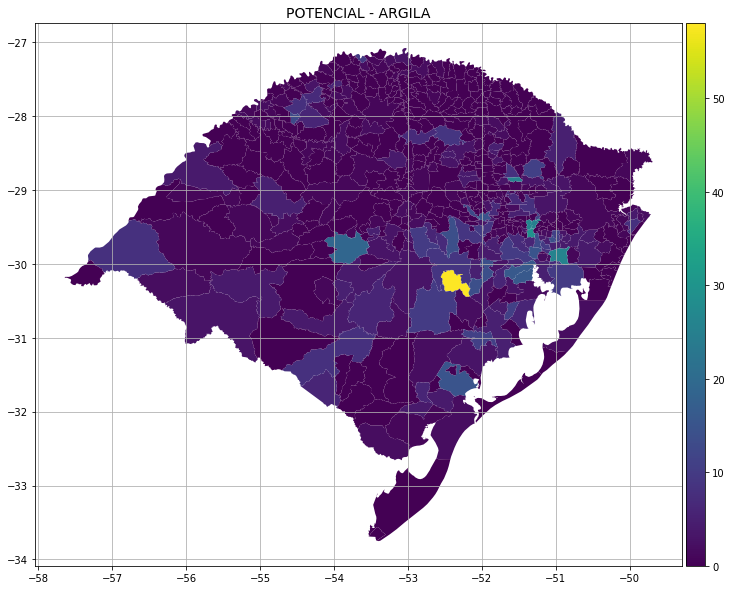

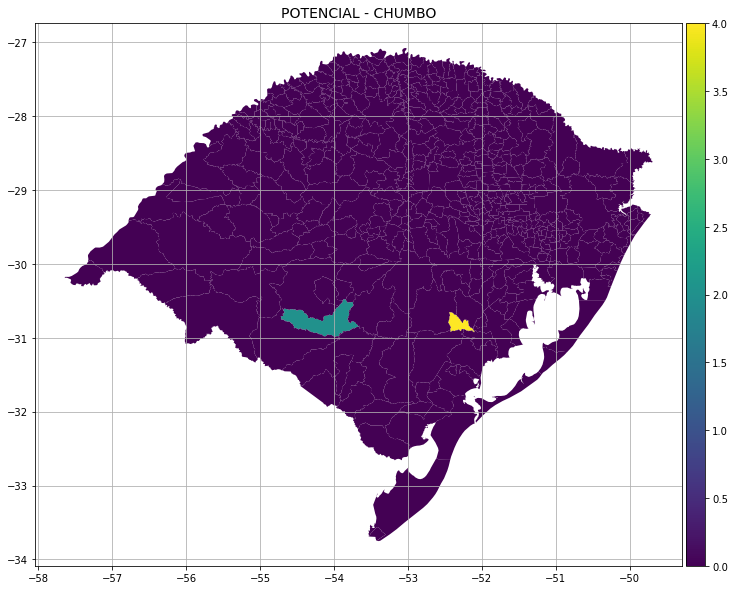

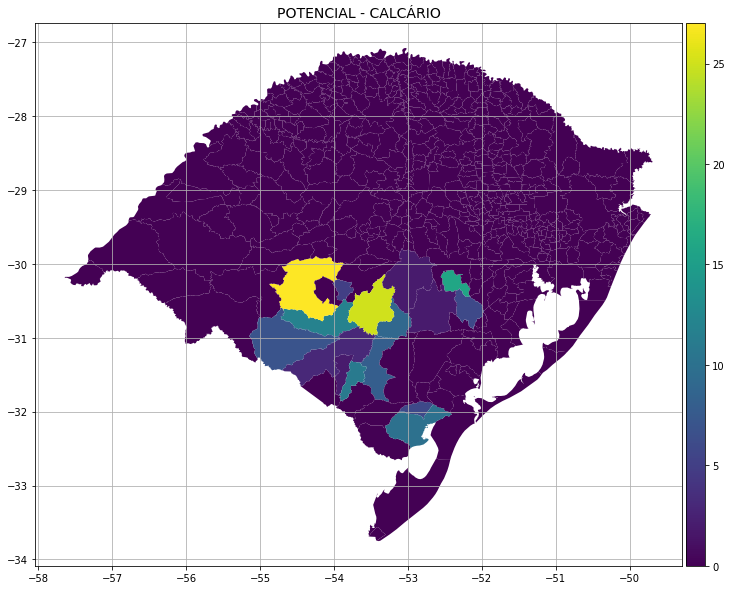

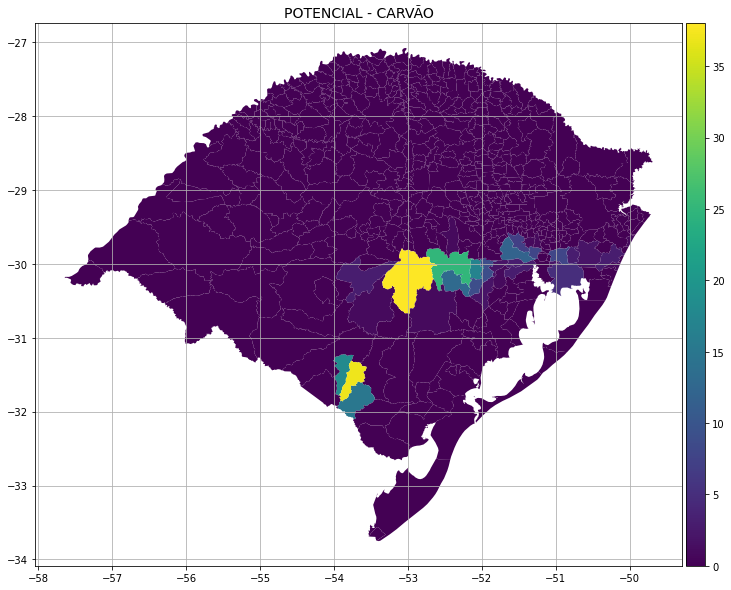

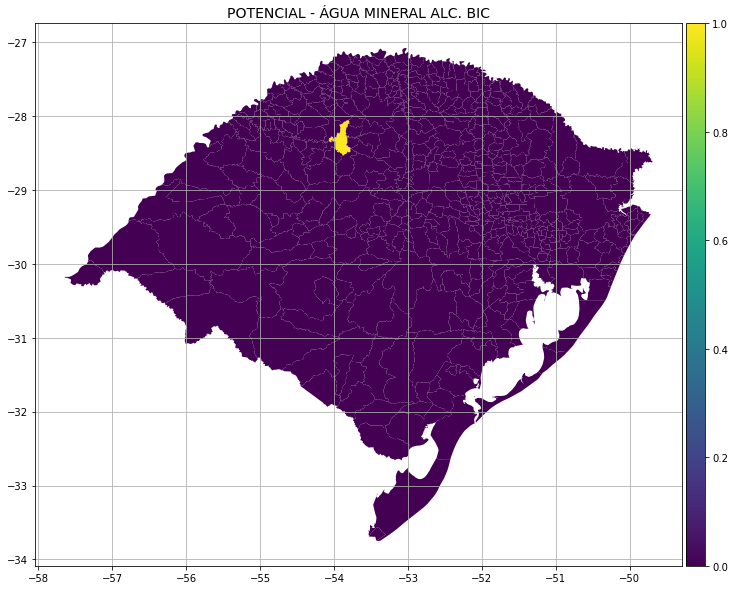

...

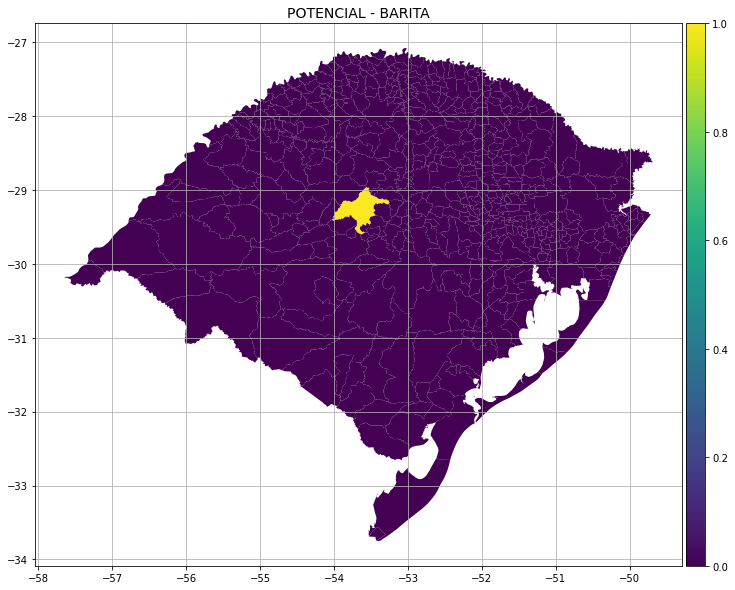

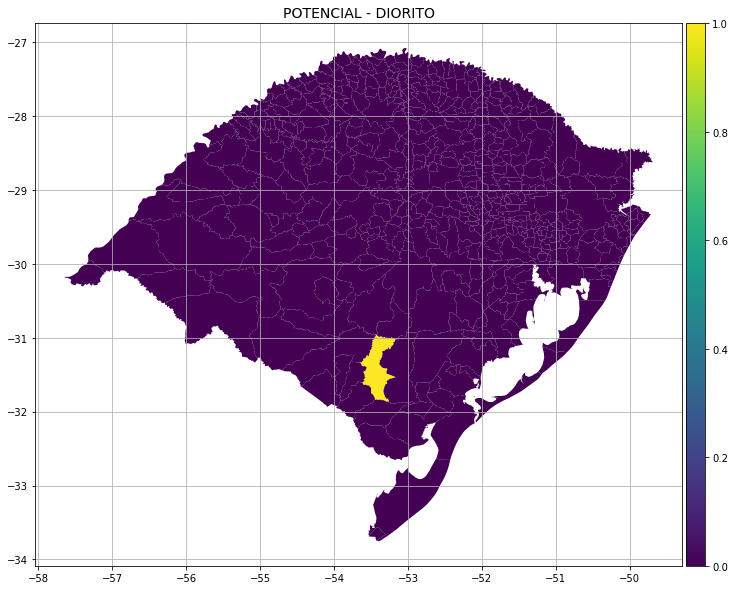

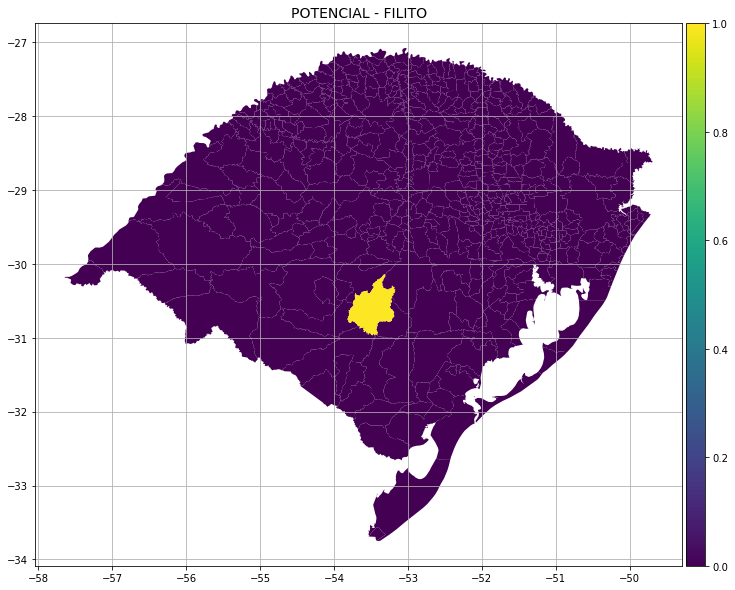

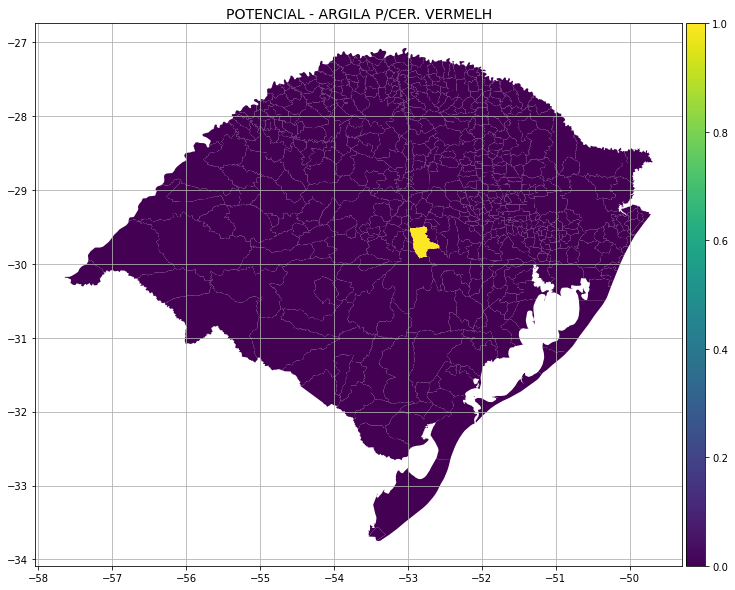

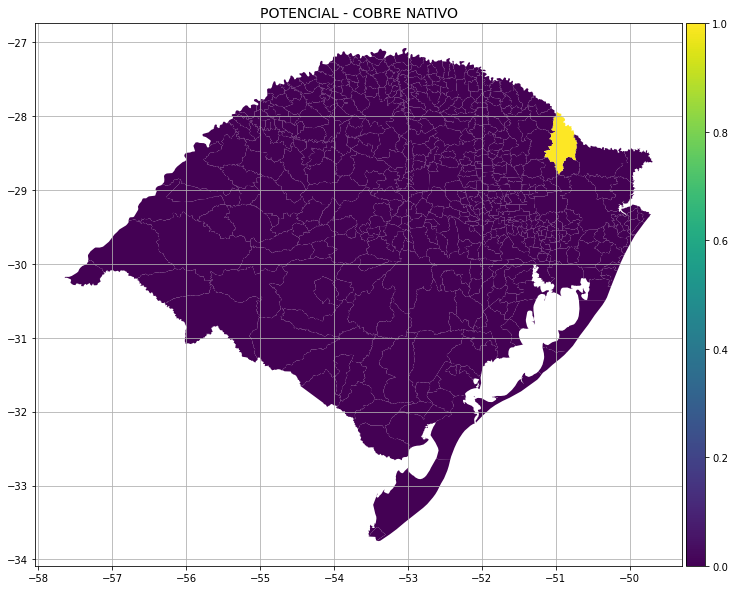

In [28]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

for mineral in minerais:
    fig, ax = plt.subplots(figsize=(12,12))
    municipios.plot(ax=ax, column=mineral, legend=False)
    plt.grid()
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='3%', pad=0.05)
    vmax = municipios[mineral].values.max()
    mappable = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=0, vmax=vmax))
    cbar = fig.colorbar(mappable, cax=cax)
    
    ax.set_title('POTENCIAL - {}'.format(mineral), loc='center', fontsize='14')
    nome = mineral.replace('/', '')
    plt.savefig(nome+".png", bbox_inches='tight')
    plt.show()